In [1]:
# =============================
# Library Imports
# =============================

import h5py
import matplotlib.pyplot as plt
import numpy as np
import astropy.io.fits as fits
from scipy.ndimage import rotate
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle

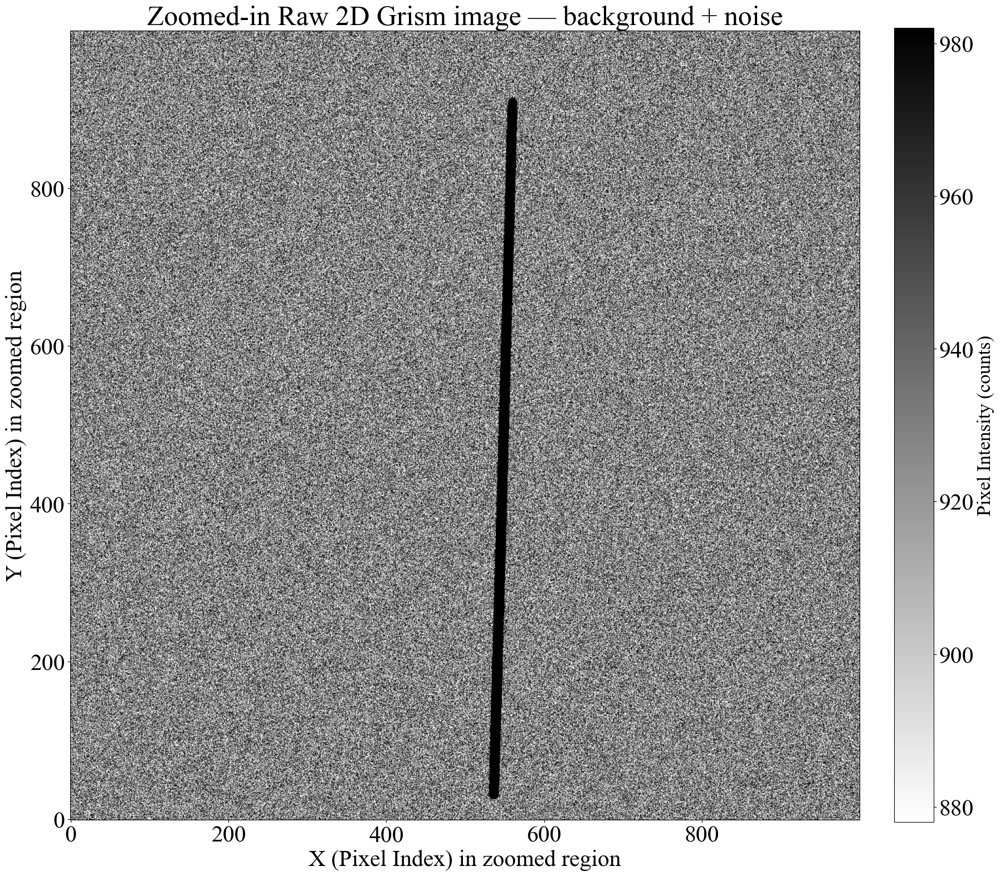

In [3]:
# Step 1: File path for the 2D grism image
grism_file = "./Grism extraction/QSO_grism.fits"

# Step 2: Load the 2D spectrum data from the FITS file
counts_noisy_1160s = fits.getdata(grism_file)

# Step 3: Define region of interest (ROI) safely for zoom-in
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, counts_noisy_1160s.shape[1])  # keep within image bounds
y_end = min(y_end, counts_noisy_1160s.shape[0])  # keep within image bounds
zoomed_counts = counts_noisy_1160s[y_start:y_end, x_start:x_end]

# Step 4: Set global plot style
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Plot 1: Linear Scale (shows strong features like emission lines)
fig1 = plt.figure(figsize=(20, 20))
plt.imshow(
    zoomed_counts,
    origin='lower',
    cmap='binary',
    vmin=np.percentile(zoomed_counts, 5),   # lower contrast bound
    vmax=np.percentile(zoomed_counts, 95)   # upper contrast bound
)
cbar1 = plt.colorbar(fraction=0.046, pad=0.04)
cbar1.set_label("Pixel Intensity (counts)", fontsize=25)
plt.title("Zoomed-in Raw 2D Grism image — background + noise")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")
plt.show()


### Grism Image Workflow

- Step 1: File path  
  The FITS file (`QSO_grism.fits`) contains the 2D dispersed spectrum image from the grism observation.  

- Step 2: Load data  
  The image data is read into a NumPy array using `astropy.io.fits.getdata()`. Each pixel holds counts recorded during the exposure.  

- Step 3: Region of interest (ROI)  
  A rectangular cutout (1500–2500 pixels in both X and Y) is extracted for zoom-in.  
  The bounds are checked against the image size with `min(...)` to avoid index errors.  

- Step 4: Global plot style  
  Font size and family are set globally for consistent figure aesthetics.  

- Plot 1: Linear scale visualization  
  The zoomed ROI is plotted with grayscale (`binary` colormap).  
  Pixel intensities are scaled to the 5th–95th percentile range for contrast.  
  The colorbar shows pixel intensity (counts). This view highlights bright features such as emission lines while still showing background and noise.  


In [3]:
# =============================
# Spectrum Setup Parameters
# =============================

# Step 1: Exposure time (s)
exposure_time = 1160  

# Step 2: Dispersion (Å/pixel)
dispersion_angstrom = 10.52  # On orbit data with come up with calibrated measurement of dispersion. 
#In this tutorial, we are giving you a simple linear dispersion which is sufficient for the simulation

# Step 3: Convert dispersion to μm/pixel
dispersion_micron = dispersion_angstrom * 1e-4  

# Step 4: Starting wavelength (μm)
wave_start = 0.987 # On orbit data with come up with calibrated measurement of starting waveleng. 
#In this tutorial, we are giving you a simple linear dispersion which is sufficient for the simulation



##### Spectrum Setup Explanations

- Step 1: Exposure time  
  Duration of image data collection in seconds. Longer exposures collect more photons and improve signal-to-noise.  

- Step 2: Dispersion in Å/pixel  
  The change in wavelength per pixel on the detector. Here, each pixel corresponds to 10.52 Å.  

- Step 3: Conversion to μm/pixel  
  For infrared work, wavelengths are often expressed in microns.  
  Since 1 Å = 1e-4 μm, the dispersion is converted accordingly.  

- Step 4: Starting wavelength  
  The wavelength at the first pixel of the spectrum.  
  Although the grism nominally starts at 1.0 μm, a direct pixel-to-pixel comparison shows that the de-tilted trace begins slightly earlier at 0.987 μm.  


Grism image dimensions after de-tilting: 4088 x 4088


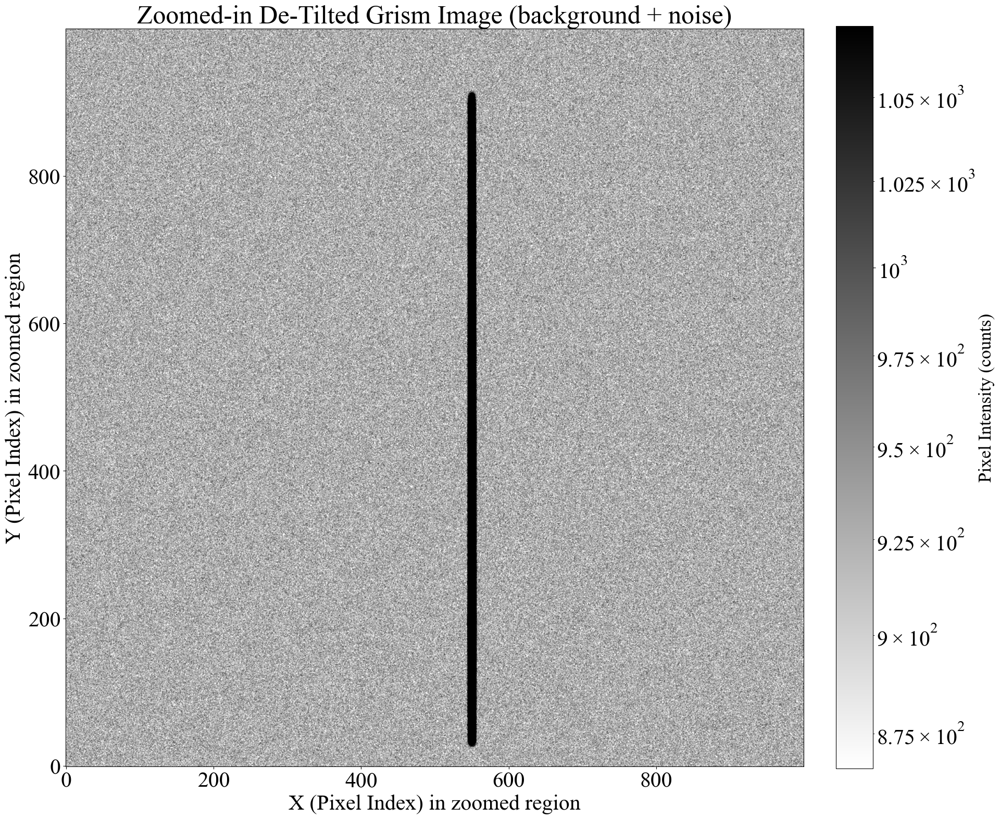

In [4]:
# =============================
# Grism Image De-Tilting and Log-Scale Plot
# =============================

# Step 1: Load the 2D grism image (with noise and background)
counts_noisy_1160s = fits.getdata(grism_file)

# Step 2: Define the rotation angle (degrees counterclockwise)
rotation_angle = -1.562  # On orbit data with come up with calibrated maesauyement of tilt angle. 
#In this tutorial, we are giving you a simple linear dispersion wgich is sufficient for the simulation


# Step 3: Rotate image with cubic interpolation, reflecting at edges
rotated_data = rotate(
    counts_noisy_1160s,
    rotation_angle,
    reshape=True,
    order=3,
    mode='reflect'
)

# Step 4: Crop rotated image back to original 4088×4088 pixels
crop_start = (rotated_data.shape[0] - 4088) // 2
crop_end = crop_start + 4088
big_data = rotated_data[crop_start:crop_end, crop_start:crop_end]

# Step 5: Confirm the shape
grism_file_shape_y, grism_file_shape_x = big_data.shape
print(f"Grism image dimensions after de-tilting: {grism_file_shape_y} x {grism_file_shape_x}")

# Step 6: Define ROI bounds
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, big_data.shape[1])
y_end = min(y_end, big_data.shape[0])

# Step 7: Extract zoomed-in ROI
zoomed_big_data = big_data[y_start:y_end, x_start:x_end]

# Step 8: Set up figure style
fig = plt.figure(figsize=(20, 20))
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 9: Plot ROI in log scale (reveals faint structures + noise)
plt.imshow(
    zoomed_big_data,
    origin='lower',
    cmap='binary',
    norm=LogNorm(
        vmin=np.percentile(zoomed_big_data[zoomed_big_data > 0], 1),  # avoid zeros
        vmax=np.percentile(zoomed_big_data, 99)
    )
)

# Step 10: Add colorbar
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Pixel Intensity (counts)", fontsize=25)

# Step 11: Title and axis labels
plt.title("Zoomed-in De-Tilted Grism Image (background + noise)")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")

# Step 12: Show the plot
plt.show()


### De-Tilting and Log-Scale Visualization

- Step 1: Load image  
  The noisy grism image is loaded from the FITS file. Each pixel stores photon counts.  

- Step 2: Rotation angle  
  The grism spectrum is tilted by 1.562°. A counterclockwise rotation corrects this.  

- Step 3: Rotate with interpolation  
  The image is rotated using cubic interpolation (`order=3`) for smoothness.  
  The `reflect` mode handles edge pixels by mirroring data.  

- Step 4: Crop back to 4088×4088  
  Rotation increases image size. The result is cropped back to the original detector dimensions.  

- Step 5: Confirm dimensions  
  Ensures the final de-tilted frame matches the expected size.  

- Step 6–7: ROI selection  
  A subregion (1500–2500 in both axes) is extracted for detailed inspection.  
  Bounds are checked against image shape to avoid indexing errors.  

- Step 8: Plot style  
  Global font settings are applied for clarity in publication-style figures.  

- Step 9: Log-scale plotting  
  Logarithmic scaling (`LogNorm`) makes faint background structures visible alongside bright emission features.  
  The lower bound excludes zeros to avoid log artifacts.  

- Step 10–12: Annotations  
  A colorbar shows counts per pixel. Title and axis labels describe the plotted region.  


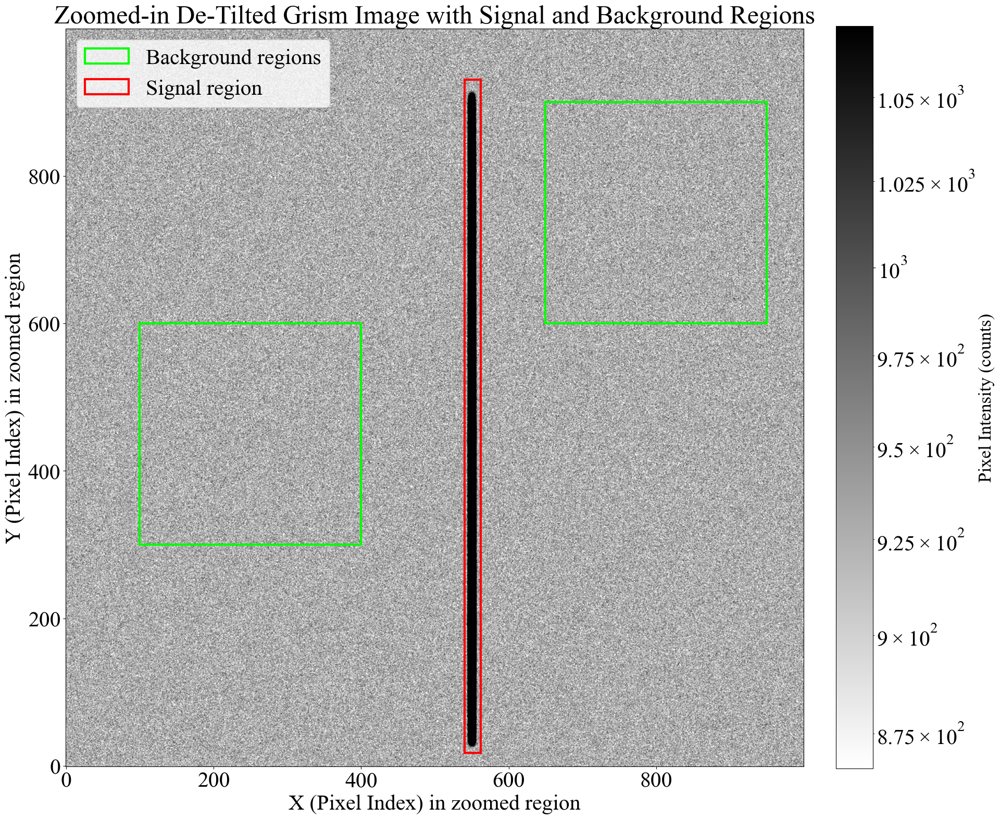

In [5]:
# =============================
# Signal and Background Region Extraction + Overlay
# =============================

# Step 1: Extract image chunks (verification / further analysis)
background_chunk_1 = big_data[1800:2100, 1600:1900]  # shape: 300×300
background_chunk_2 = big_data[2100:2400, 2150:2450]  # shape: 300×300
signal_chunk       = big_data[1518:2430, 2040:2062]  # shape: 912×22

# Step 2: Define ROI bounds (zoom-in window)
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, big_data.shape[1])
y_end = min(y_end, big_data.shape[0])

# Step 3: Extract zoomed-in data
zoomed_big_data = big_data[y_start:y_end, x_start:x_end]

# Step 4: Set up figure
fig, ax = plt.subplots(figsize=(20, 20))
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 5: Plot zoomed-in image with log normalization
img = ax.imshow(
    zoomed_big_data,
    origin='lower',
    cmap='binary',
    norm=LogNorm(
        vmin=np.percentile(zoomed_big_data[zoomed_big_data > 0], 1),
        vmax=np.percentile(zoomed_big_data, 99)
    )
)

# Step 6: Add colorbar
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Pixel Intensity (counts)", fontsize=25)

# Step 7: Overlay background regions (lime rectangles)
bg_rects = []
bg_boxes = [(1600, 1800), (2150, 2100)]  # (x, y) anchor positions
for x0, y0 in bg_boxes:
    if x_start <= x0 < x_end and y_start <= y0 < y_end:
        rect = Rectangle(
            (x0 - x_start, y0 - y_start), 300, 300,
            linewidth=3,
            edgecolor='lime',
            facecolor='none'
        )
        ax.add_patch(rect)
        bg_rects.append(rect)

# Step 8: Overlay signal region (red rectangle)
signal_rect = None
signal_x, signal_y = 2040, 1518
if x_start <= signal_x < x_end and y_start <= signal_y < y_end:
    signal_rect = Rectangle(
        (signal_x - x_start, signal_y - y_start), 22, 912,
        linewidth=3,
        edgecolor='r',
        facecolor='none'
    )
    ax.add_patch(signal_rect)

# Step 9: Add legend
legend_elements = []
if bg_rects:
    legend_elements.append(Rectangle((0, 0), 1, 1, edgecolor='lime', facecolor='none', linewidth=3, label='Background regions'))
if signal_rect:
    legend_elements.append(Rectangle((0, 0), 1, 1, edgecolor='r', facecolor='none', linewidth=3, label='Signal region'))
ax.legend(handles=legend_elements, loc='upper left', frameon=True)

# Step 10: Add title and axis labels
ax.set_title("Zoomed-in De-Tilted Grism Image with Signal and Background Regions")
ax.set_xlabel("X (Pixel Index) in zoomed region")
ax.set_ylabel("Y (Pixel Index) in zoomed region")

# Step 11: Show plot
plt.show()


### Signal and Background Region Extraction

- Step 1: Image chunks  
  Specific subarrays are extracted for inspection:  
  - Background chunks (300×300 each) sample noise and background levels.  
  - Signal chunk (912×22) captures the main spectral trace.  

- Step 2–3: ROI  
  The zoom-in region is defined as pixels [1500–2500] in both axes.  
  Bound checks ensure indices do not exceed image dimensions.  

- Step 4: Figure setup  
  Large figure size (20×20) with Times New Roman font for clarity.  

- Step 5: Log-scale image plot  
  The zoomed image is plotted with logarithmic normalization to reveal faint structures alongside strong signal.  

- Step 6: Colorbar  
  Displays pixel intensities (counts) for reference.  

- Step 7: Background overlays  
  Two lime green rectangles highlight background regions used for noise estimation.  

- Step 8: Signal overlay  
  A red rectangle marks the extracted spectral trace region.  

- Step 9: Legend  
  A legend explains the overlay colors: lime for background, red for signal.  

- Step 10–11: Annotations  
  Title and axis labels provide context for the zoomed-in detector region.  


Estimated Median Background for 1160s in counts: 927.8453369140625


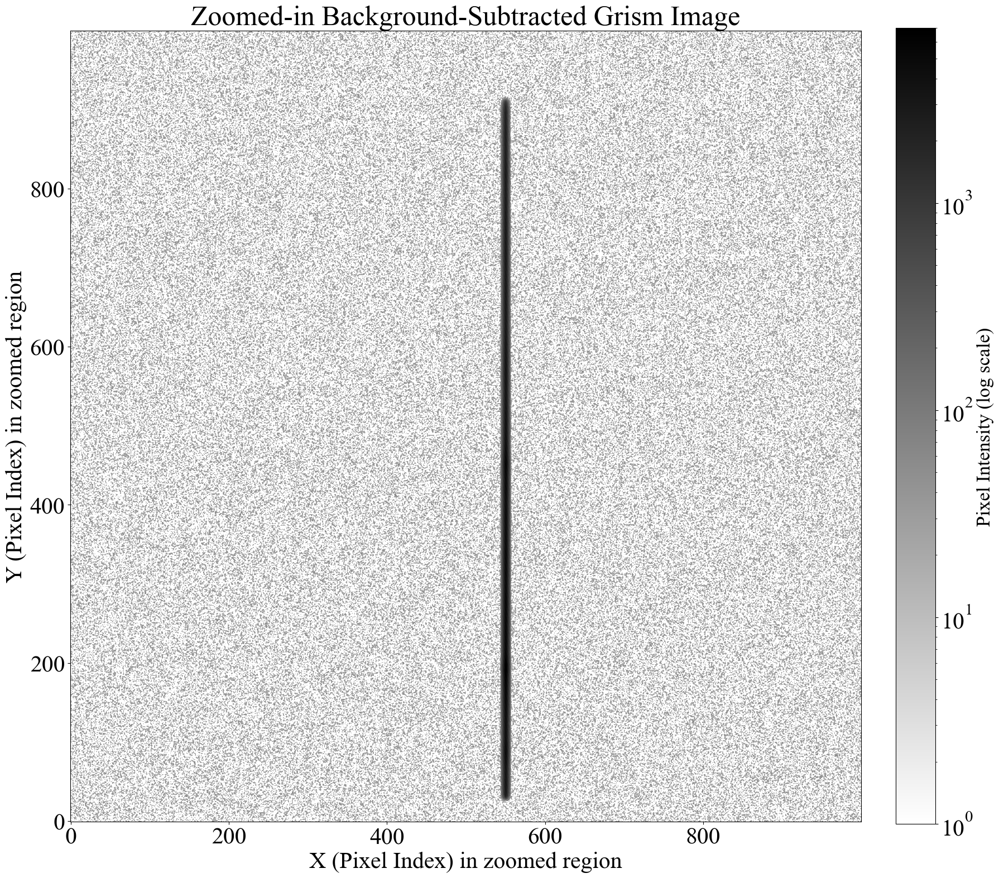

In [6]:
# =============================
# Background Estimation, Subtraction, and Zoomed Visualization
# =============================

# Step 1: Estimate background from signal-free chunks
# (avoid the known signal window: y=1518–2440, x=2040–2066)
median_background_1 = np.nanmedian(background_chunk_1)
median_background_2 = np.nanmedian(background_chunk_2)
median_background = 0.5 * (median_background_1 + median_background_2)
print(f"Estimated Median Background for 1160s in counts: {median_background}")

# Step 2: Build a constant background frame (same size as image)
background = np.full((big_data.shape[0], big_data.shape[1]), median_background)

# Step 3: Subtract background from the de-tilted image
background_subtracted_big_data = big_data - background

# Step 4: Focus only on the known spectral trace region
# (crop to the signal window for any downstream analysis)
data = background_subtracted_big_data[1518:2440, 2040:2066]

# Step 5: Define ROI bounds for a zoomed view (publication-friendly panel)
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, background_subtracted_big_data.shape[1])
y_end = min(y_end, background_subtracted_big_data.shape[0])

# Step 6: Extract zoomed ROI
zoomed_background_subtracted_big_data = background_subtracted_big_data[y_start:y_end, x_start:x_end]

# Step 7: Figure + global font
fig = plt.figure(figsize=(20, 20))
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 8: Display zoomed image (log scale)
# vmin must be > 0 for LogNorm; choose fixed range suitable for this dataset
plt.imshow(
    zoomed_background_subtracted_big_data,
    origin='lower',
    cmap='binary',
    norm=LogNorm(vmin=1, vmax=7000)
)

# Step 9: Colorbar
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Pixel Intensity (log scale)", fontsize=25)

# Step 10: Titles and labels
plt.title("Zoomed-in Background-Subtracted Grism Image")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")

# Step 11: Render
plt.show()


### Background subtraction and zoomed view

- Step 1: Background estimate  
  Compute median counts from two signal-free chunks near the trace but outside the known signal window (y=1518–2440, x=2040–2066). Using the median is robust to hot pixels and outliers.

- Step 2: Constant background frame  
  Create a full-frame array where each pixel equals the estimated median background. This models a spatially flat background.

- Step 3: Subtract background  
  Remove the constant background from the de-tilted image to isolate the source signal and reduce large-scale offsets.

- Step 4: Trace-only crop  
  Slice the background-subtracted frame to the known trace window for any downstream extraction or statistics.

- Step 5–6: ROI for visualization  
  Define and extract a larger, square zoom around the trace (1500–2500 in both axes) for a publication-friendly figure.

- Step 7–8: Log-scale display  
  Use logarithmic normalization (LogNorm) to show faint structure and residual background alongside bright pixels. vmin must be > 0.

- Step 9–11: Annotations  
  Add a labeled colorbar, descriptive title, and axis labels; render the figure.


In [7]:
# =============================
# Extract 1D Spectrum from 2D Trace
# =============================

# Step 1: Dimensions of cropped spectral region
ny, nx = data.shape  # "data" is the 2D cropped trace (y: dispersion, x: spatial)

# Step 2: Collapse along spatial direction
# Sum along detector columns to combine flux into a single spectrum
spectrum_1d = np.sum(data, axis=1)

## Extracting a 1D Spectrum (Simple Summation)

**Step 1: Dimensions of the cropped region**  
The 2D trace `data` has shape `(ny, nx)`:
- **y-axis (ny):** dispersion direction → each row corresponds to a wavelength bin.  
- **x-axis (nx):** spatial direction → shows how light spreads perpendicular to dispersion (the PSF or slit).  

So if `data.shape = (40, 20)`, that means 40 dispersion bins and 20 spatial bins.

---

**Step 2: Collapsing along the spatial axis**  
To build a 1D spectrum, we want flux as a function of wavelength.  
At each wavelength row, flux is spread out spatially across detector columns.  
We collect all that flux by summing along the spatial axis:

$
F_{\text{1D}}(y) = \sum_{x=1}^{nx} \, \text{data}(y, x)
$

This produces a 1D array `spectrum_1d` of length `ny`.

---

**Why this works:**  
- Each row = photons from a single wavelength bin.  
- Summing across the row gathers all photons into one number = the total flux at that wavelength.  
- This method is called **boxcar (or aperture) summation**.  

---

**Note:**  
- This is the simplest extraction method.  
- It gives equal weight to every pixel in the spatial direction.  
- More advanced approaches (e.g. *optimal extraction*, Horne 1986) weight pixels by their profile and noise, improving signal-to-noise.  


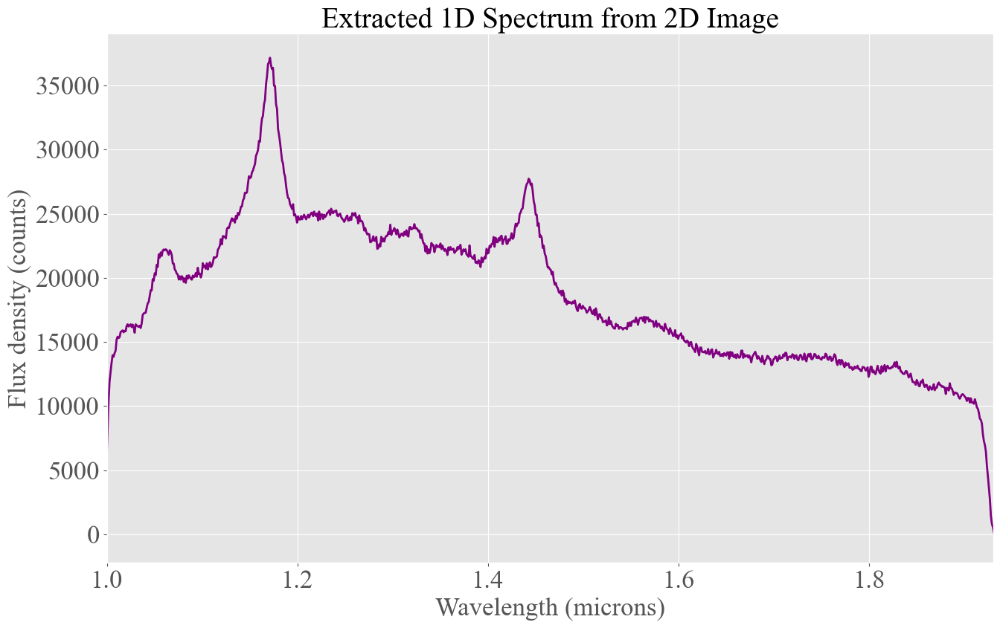

In [13]:
# Step 3: Build wavelength grid
# Use starting wavelength + dispersion per pixel to map pixel index → wavelength
rough_wave = np.arange(ny) * dispersion_micron + wave_start

# Step 4: Set global plot style
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 25,           # Default text size
    'axes.titlesize': 28,      # Plot title size
    'axes.labelsize': 26,      # Axis label size
    'xtick.labelsize': 25,     # X tick size
    'ytick.labelsize': 25,     # Y tick size
    'legend.fontsize': 25,     # Legend font
    'figure.titlesize': 28     # Figure title
})

# Step 5: Plot spectrum
plt.figure(figsize=(14, 9))
plt.plot(rough_wave, spectrum_1d, linewidth=2, color='purple')
plt.xlabel("Wavelength (microns)", fontsize=25)
plt.ylabel("Flux density (counts)", fontsize=25)
plt.title("Extracted 1D Spectrum from 2D Image", fontsize=28)
plt.grid(True)
plt.xlim(1, 1.93)  # Limit to expected grism coverage
plt.tight_layout()
plt.show()


### 1D Spectrum Extraction

- Step 1: Dimensions  
  The cropped 2D trace (`data`) has shape (ny, nx).  
  Here ny = dispersion axis (wavelength direction), nx = spatial axis.  

- Step 2: Collapse to 1D  
  Summing along the spatial axis (`axis=1`) collapses the trace into a 1D spectrum.  
  This integrates flux across the slitless “aperture” in the 2D cutout.  

- Step 3: Wavelength mapping  
  Pixel index is converted to wavelength using:  
  $
  \lambda = \text{wave\_start} + i \times \text{dispersion\_micron}
  $ 
  where \( i \) is the row index along the dispersion axis.  

- Step 4: Plot styling  
  A consistent `ggplot` style and enlarged fonts are applied for clarity.  

- Step 5: Spectrum plot  
  The extracted 1D spectrum is shown as flux density (counts) vs wavelength (µm).  
  The x-axis is restricted to 1.0–1.93 µm, the grism’s effective coverage.  


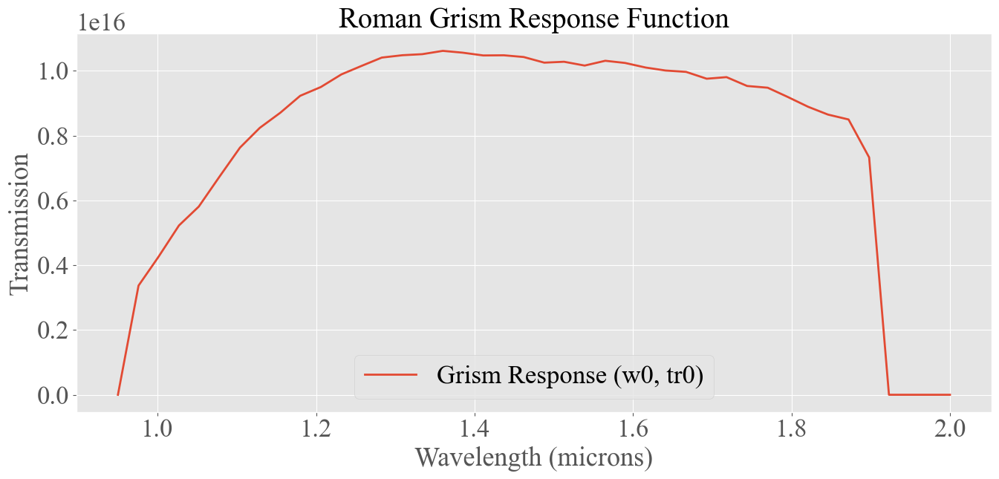

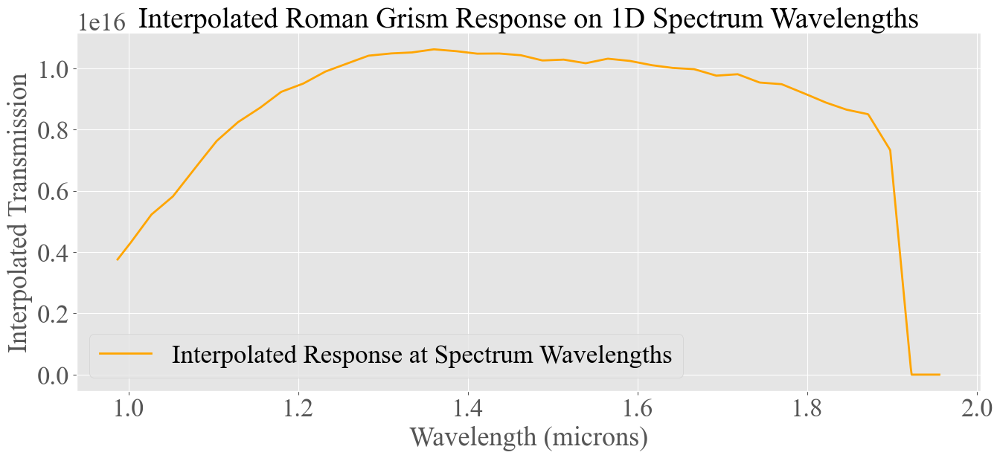

In [15]:
# =============================
# 1D Spectrum Extraction + Grism Response Interpolation
# =============================

# Step 1: Get dimensions of cropped spectrum
ny, nx = data.shape  # ny = rows (dispersion axis), nx = columns (spatial axis)

# Step 2: Collapse 2D spectrum to 1D
spectrum_1d = np.sum(data, axis=1)  # sum along spatial axis

# Step 3: Build wavelength grid (linear dispersion assumption)
rough_wave = np.arange(ny) * dispersion_micron + wave_start

# Step 4: Load grism response function (Roman)
response_data = np.loadtxt('./grism_response_function.txt')

# Step 5: Separate wavelength and throughput columns
w0 = response_data[:, 0]  # wavelength (microns)
tr0 = response_data[:, 1]  # transmission (0–1)

# Step 6: Interpolate response at extracted spectrum wavelengths
y1 = np.interp(rough_wave, w0, tr0)

# Step 7: Plot original grism response function
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 25,
    'axes.titlesize': 28,
    'axes.labelsize': 26,
    'xtick.labelsize': 25,
    'ytick.labelsize': 25,
    'legend.fontsize': 25,
    'figure.titlesize': 28
})

plt.figure(figsize=(14, 7))
plt.plot(w0, tr0, label="Grism Response (w0, tr0)", linewidth=2)
plt.xlabel("Wavelength (microns)")
plt.ylabel("Transmission")
plt.title("Roman Grism Response Function")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Step 8: Plot interpolated response at spectrum wavelengths
plt.figure(figsize=(14, 7))
plt.plot(rough_wave, y1, label="Interpolated Response at Spectrum Wavelengths", color='orange', linewidth=2)
plt.xlabel("Wavelength (microns)")
plt.ylabel("Interpolated Transmission")
plt.title("Interpolated Roman Grism Response on 1D Spectrum Wavelengths")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


### 1D Spectrum and Grism Response

- Step 1: Dimensions  
  The cropped spectral cutout (`data`) has shape (ny, nx).  
  - ny = number of rows = dispersion/wavelength direction  
  - nx = number of columns = spatial direction  

- Step 2: Collapse to 1D  
  Summing along the spatial axis (`axis=1`) integrates flux to yield a 1D spectrum.  

- Step 3: Wavelength grid  
  Wavelengths are mapped using  
  $\lambda = \mathrm{wave\_start} + i \times \mathrm{dispersion\_micron}$  
  where \( i \) is the pixel index along ny.  

- Step 4–5: Grism response  
  The Roman grism response file is loaded and split into:  
  - `w0`: wavelength (µm)  
  - `tr0`: throughput/transmission (0–1)  

- Step 6: Interpolation  
  The response curve is interpolated at the same wavelengths as the extracted spectrum (`rough_wave`).  

- Step 7: Original response plot  
  Shows the full throughput curve of the Roman grism.  

- Step 8: Interpolated response plot  
  Overlays the response function onto the sampled spectrum wavelengths, ensuring instrument sensitivity is matched to data.  


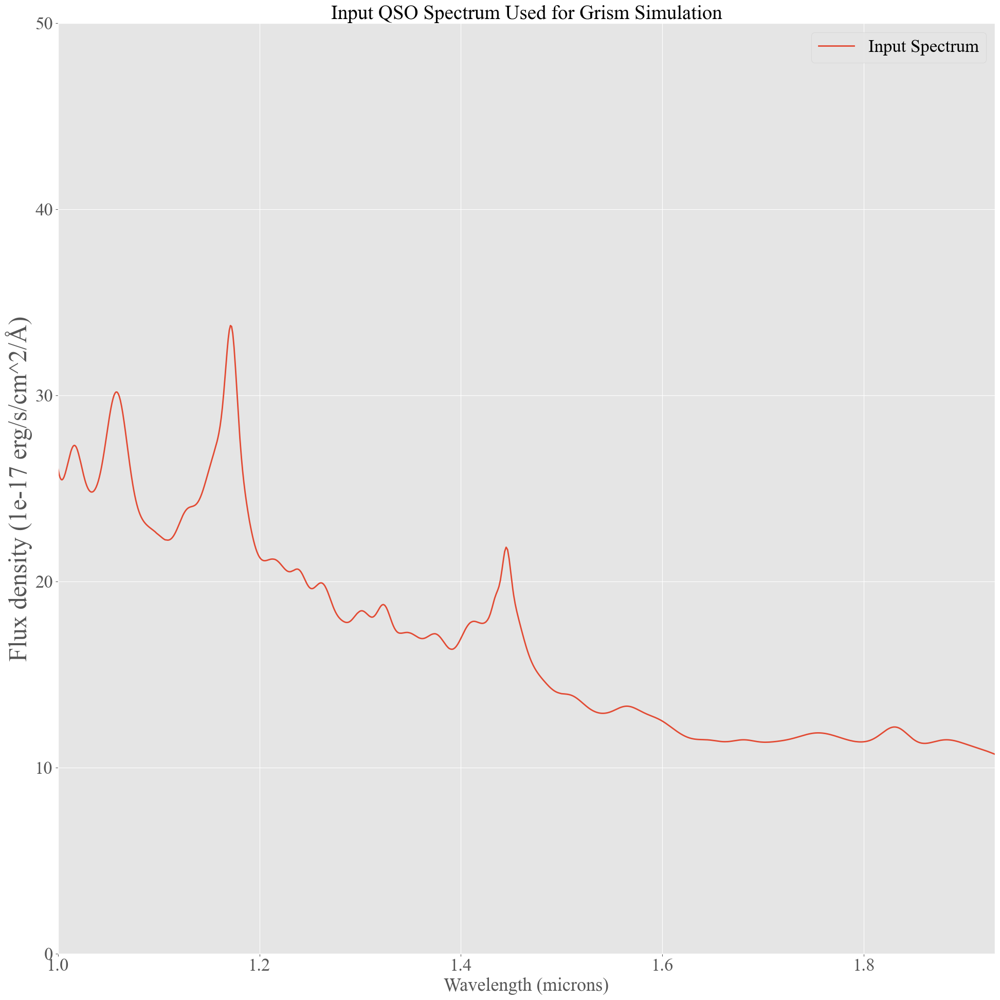

In [16]:
# =============================
# Input Spectrum Visualization
# =============================

# Step 1: Load input spectrum from HDF5
with h5py.File('./QSO_sed_input.hdf5', 'r') as f:
    data = f['SED/1'][:]  # Dataset shape: (9300, 2)

# Step 2: Extract wavelength and flux columns
wavelength = data[:, 0]  # microns
flux = data[:, 1]        # flux density in 1e-17 erg/s/cm^2/Å

# Step 3: Set global plot style
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 25,
    'axes.titlesize': 28,
    'axes.labelsize': 26,
    'xtick.labelsize': 25,
    'ytick.labelsize': 25,
    'legend.fontsize': 25,
    'figure.titlesize': 28
})

# Step 4: Plot spectrum
fig = plt.figure(figsize=(20, 20))
plt.plot(wavelength, flux, label="Input Spectrum", linewidth=2)
plt.xlabel("Wavelength (microns)")
plt.ylabel("Flux density (1e-17 erg/s/cm^2/Å)", fontsize=35)
plt.title("Input QSO Spectrum Used for Grism Simulation")
plt.grid(True)
plt.legend()
plt.xlim(1, 1.93)   # Focus on grism wavelength coverage
plt.ylim(0, 50)     # Expected flux scale
plt.tight_layout()
plt.show()


### Input QSO Spectrum

- Step 1: Load spectrum  
  The input SED (Spectral Energy Distribution) is read from the HDF5 file (`QSO_sed_input.hdf5`).  
  The dataset `SED/1` has shape (9300, 2), where column 0 is wavelength and column 1 is flux density.  

- Step 2: Extract arrays  
  - `wavelength`: microns  
  - `flux`: flux density in units of \(10^{-17}\) erg/s/cm²/Å  

- Step 3: Style settings  
  A consistent `ggplot` style and large fonts are applied for clarity.  

- Step 4: Plot  
  - X-axis: wavelength (1–1.93 μm, matching the Roman grism coverage).  
  - Y-axis: flux density, capped at 50 (to emphasize main features).  
  - Title and legend clearly label the dataset.  

This plot provides a sanity check: what goes into the simulator (input QSO SED) should be consistent with what comes out after grism simulation.  


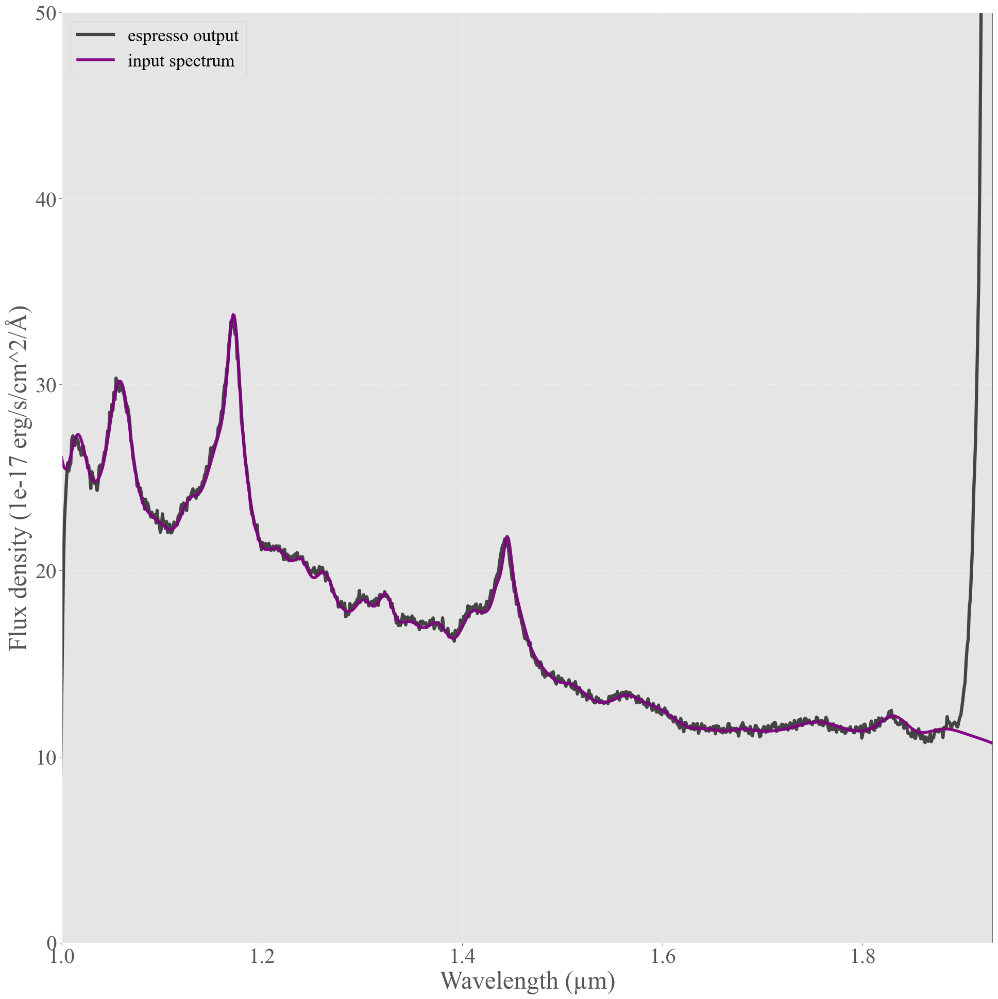

In [17]:
# =============================
# Input vs Output Spectrum (Response-Corrected)
# =============================

import matplotlib.pyplot as plt  # plotting
import seaborn as sns            # style helper (optional)
import numpy as np               # numerics

# Step 1: Style
plt.style.use('ggplot')

# Step 2: Global fonts
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 3: Figure
fig = plt.figure(figsize=(20, 20))

# Step 4: Guard against division by zero/small response
# (avoid spikes where instrument throughput is ~0)
y1_safe = np.clip(y1, 1e-6, None)

# Step 5: Plot response-corrected extracted spectrum
# Scale: counts → (erg/s/cm^2/Å) using exposure_time and dispersion per Å,
# then multiply by 1e17 to match the y-axis label unit.
plt.plot(
    rough_wave,
    spectrum_1d / y1_safe * 1e17 / dispersion_angstrom / exposure_time,
    linestyle='-',
    color='k',
    label='espresso output',
    lw=4.5,
    alpha=0.7
)

# Step 6: Plot input spectrum (truth)
plt.plot(
    wavelength,
    flux,
    linewidth=4,
    label='input spectrum',
    color='purple',
    alpha=0.96
)

# Step 7: Labels, legend, limits, grid
plt.xlabel('Wavelength (µm)', fontsize=35)
plt.ylabel('Flux density (1e-17 erg/s/cm^2/Å)', fontsize=35)
plt.legend(fontsize=25, loc='upper left')
plt.xlim(1, 1.93)
plt.ylim(0, 50)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='white', alpha=0.6)

# Step 8: Layout, ticks, save, show
plt.tight_layout()
plt.tick_params(axis='x', labelsize=30)
plt.tick_params(axis='y', labelsize=30)
plt.savefig('/Users/msingha/Downloads/input_v_output_ggplot_style.pdf', dpi=300)
plt.show()


### Input vs Output Spectrum (with Response Correction)

- Style and Fonts  
  Uses a ggplot-like style and larger fonts for readability in publication figures.

- Response Guard  
  `y1_safe = clip(y1, 1e-6, ∞)` prevents numerical blow-ups where the instrument throughput is ~0 (edges, filter leaks).

- Output Scaling  
  The extracted 1D spectrum (counts) is converted to flux density units:
 $F_\lambda \propto \frac{\mathrm{spectrum\_1d}}{\text{exposure\_time} \times \mathrm{dispersion\_Å}} \times \frac{1}{\mathrm{throughput}}$
  Then multiplied by \(10^{17}\) to match the y-axis unit label ( \(10^{-17}\) erg/s/cm²/Å ).

- Curves  
  - **espresso output**: response-corrected extracted spectrum.  
  - **input spectrum**: the truth SED used to drive the simulator.

- Axes and Limits  
  Wavelength limited to 1.0–1.93 µm (Roman WFI grism range), flux to [0, 50] for a clean overlay.

- Practical Tips  
  - Ensure `rough_wave` fully overlaps the response grid (`w0`) and input wavelengths.  
  - If residual tilt or misalignment remains, consider subpixel re-centering or a wavelength offset term.  
  - Optionally mask wavelengths where `y1 < 0.02` to avoid noisy divisions at the bandpass edges.
